In [49]:
%matplotlib inline

from eolearn.core import EOTask, EOPatch, LinearWorkflow, Dependency, FeatureType
from eolearn.io import S2L1CWCSInput
from eolearn.core import LoadFromDisk
from eolearn.features import SimpleFilterTask
from eolearn.geometry import VectorToRaster

from eolearn.mask import AddCloudMaskTask, get_s2_pixel_cloud_detector
from eolearn.mask import AddValidDataMaskTask
from sentinelhub import BBoxSplitter, BBox, CRS, CustomUrlParam
from sentinelhub.geo_utils import wgs84_to_pixel, get_utm_crs

import rasterio
from rasterio.plot import show
from osgeo import gdal, osr
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import os
import scipy.misc
from scipy.ndimage.morphology import binary_erosion, binary_closing, binary_opening
from skimage.filters import sobel
from shapely.geometry import Point
from dateutil import parser
import cv2
import copy
import datetime

In [50]:
# Provide path to the dataset directory, the date for acquisition and the location.
# Use the same dataset directory structure as originally provided
# You can also change "max_length_ship" for matching AIS data and satellite imagery data

# ===CHANGE=THIS=== #
base_dir = "/media/dejan/hdd640/PIXEL_EO"
satellite_imagery_date = "2016_03_06" # year_month_day
location = "sf_bay" # "sf_bay" or "long_beach" -> select where does satellite_imagery come from
max_length_ship = 50
# ================= #

# Currently we use EOPatch as it contains all the data. We don't use .tiff for now.
eo_patch_path = os.path.join(base_dir, "sentinel_data", location, satellite_imagery_date)
year = os.path.basename(satellite_imagery_date).split("_")[0]
mask_filename = "/" # currently not used
json_filename = "/" # currently not used
ais_dirname = os.path.join(base_dir, "AIS_data/AIS_ASCII_by_UTM_Month", year)
ais_filename = os.path.join(ais_dirname, "AIS_{}_{}.csv".format("_".join(satellite_imagery_date.split("_")[:2]),
                                                            "Zone10" if location == "sf_bay" else "Zone11"))

print("\x1b[31mSatellite imagery (or EOPatch directory): \x1b[0m" + eo_patch_path)
print("\x1b[31mUDM file (cloud mask) \x1b[0m" + mask_filename)
print("\x1b[31mJSON file (metadata) \x1b[0m" + json_filename)
print("\x1b[31mAIS data: \x1b[0m" + ais_filename)

Satellite imagery (or EOPatch directory): /media/dejan/hdd640/PIXEL_EO/sentinel_data/sf_bay/2016_03_06
UDM file (cloud mask) /
JSON file (metadata) /
AIS data: /media/dejan/hdd640/PIXEL_EO/AIS_data/AIS_ASCII_by_UTM_Month/2016/AIS_2016_03_Zone10.csv


In [51]:
# Open image with gdal
ds = gdal.Open(os.path.join(eo_patch_path, "patch_0.tif"))
xoff, a, b, yoff, d, e = ds.GetGeoTransform()

# Get projection information from source image
ds_proj = ds.GetProjectionRef()
ds_srs = osr.SpatialReference(ds_proj)

# Get the source image's geographic coordinate system (the 'GEOGCS' node of ds_srs)
geogcs = ds_srs.CloneGeogCS()

ais_src = osr.SpatialReference()
ais_src.SetWellKnownGeogCS("WGS84")
transform = osr.CoordinateTransformation(ais_src, ds_srs)

transform_tiff = osr.CoordinateTransformation(ds_srs, ais_src)
lrx = xoff + (ds.RasterXSize * a)
lry = yoff + (ds.RasterYSize * e)
lon1, lat1, _ = transform_tiff.TransformPoint(xoff, yoff)
lon2, lat2, _ = transform_tiff.TransformPoint(lrx, lry)

In [52]:
# Load EOPatch
# We expect only 1 EOPatch for each day -> "eopatch_0"
patch_load_task = LoadFromDisk(eo_patch_path)
eopatch = patch_load_task.execute(eopatch_folder="eopatch_0")
rgb = np.squeeze(np.transpose(eopatch["data"]["TRUE-COLOR-S2-L1C"], (0, 3, 1, 2)), axis=0)
mask_cloud = np.logical_or(eopatch["mask"]["CLM"].astype("bool"), ~eopatch["mask"]["IS_DATA"].astype("bool"))
mask_cloud = np.squeeze(np.transpose(mask_cloud, (0, 3, 1, 2)), axis=0)
print(eopatch)

EOPatch(
  data: {
    CLP: numpy.ndarray(shape=(1, 1597, 2369, 1), dtype=float32)
    TRUE-COLOR-S2-L1C: numpy.ndarray(shape=(1, 1597, 2369, 3), dtype=float32)
  }
  mask: {
    CLM: numpy.ndarray(shape=(1, 1597, 2369, 1), dtype=bool)
    IS_DATA: numpy.ndarray(shape=(1, 1597, 2369, 1), dtype=bool)
  }
  scalar: {}
  label: {}
  vector: {}
  data_timeless: {}
  mask_timeless: {}
  scalar_timeless: {}
  label_timeless: {}
  vector_timeless: {}
  meta_info: {
    maxcc: 0.9
    service_type: 'wcs'
    size_x: '10m'
    size_y: '10m'
    time_difference: datetime.timedelta(-1, 86399)
    time_interval: datetime.date(2016, 3, 6)
  }
  bbox: BBox(((-122.47283935546874, 37.70202228211617), (-122.20333099365234, 37.84557924966549)), crs=EPSG:4326)
  timestamp: [datetime.datetime(2016, 3, 6, 19, 3, 54)]
)


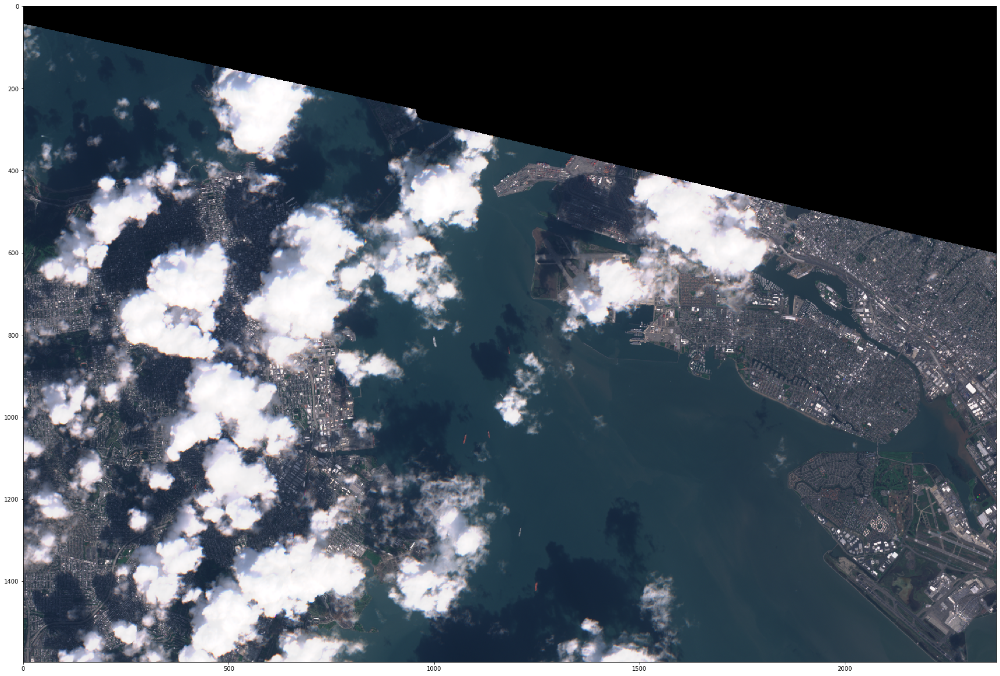

In [53]:
fig, ax = plt.subplots(figsize=(30, 30))
show(rgb, ax=ax)

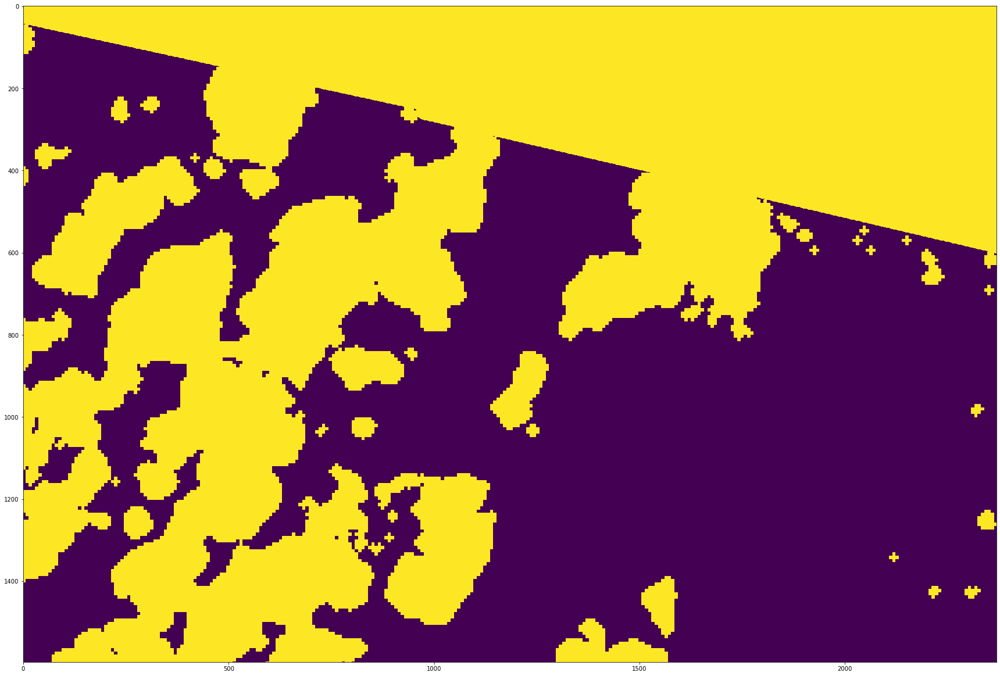

In [54]:
fig, ax = plt.subplots(figsize=(30, 30))
show(mask_cloud, ax=ax)

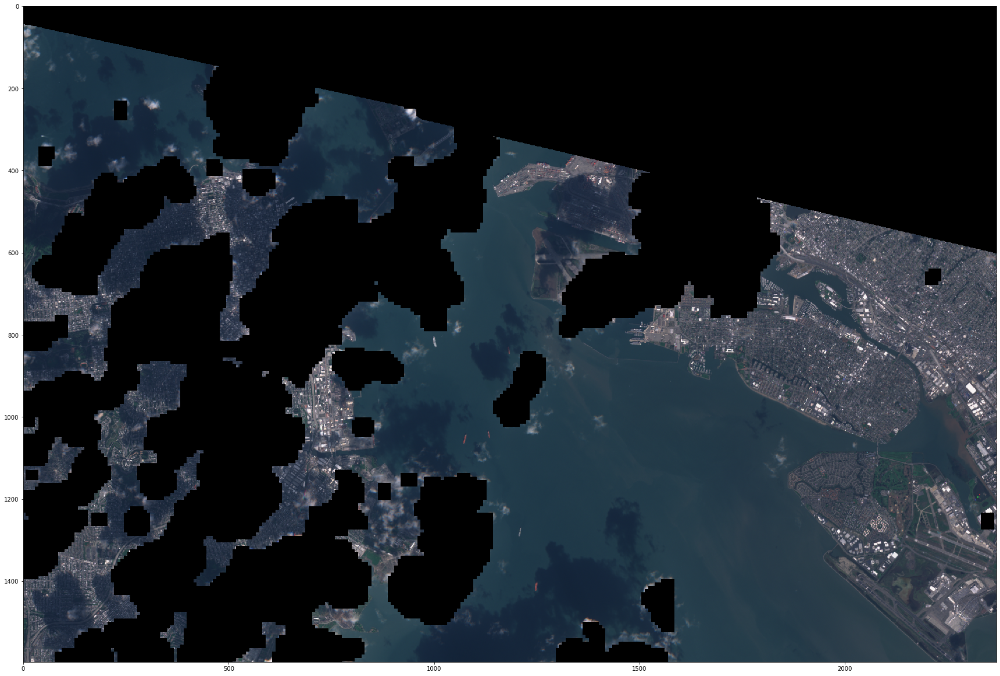

In [55]:
mask_cloud_eroded = binary_closing(mask_cloud, structure=np.ones((1,50,50)).astype(mask_cloud.dtype))
mask_cloud_eroded = binary_opening(mask_cloud, structure=np.ones((1,25,25)).astype(mask_cloud.dtype))
mask_cloud_free = rgb * np.repeat(~mask_cloud_eroded, 3, axis=0)
fig, ax = plt.subplots(figsize=(30, 30))
show(mask_cloud_free, ax=ax)

In [56]:
# load AIS data
df = pd.read_csv(ais_filename)
#df = dd.read_csv(ais_filename)
df["BaseDateTime"] = pd.to_datetime(df["BaseDateTime"])
#df.sort_values(by=["BaseDateTime"])
df.head()

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo
0,367677120,2016-03-01 00:00:01,48.06412,-125.16167,10.4,23.6,31.0,NaN,NaN,NaN,NaN,under way using engine,NaN,NaN,NaN,NaN
1,367498540,2016-03-01 00:00:06,47.65469,-122.36701,0.0,-112.0,511.0,WENDY O,IMO7638466,WDF8784,1025.0,under way using engine,29.85,9.78,3.9,31.0
2,367154120,2016-03-01 00:00:07,45.63942,-122.77776,0.0,-139.3,150.0,NaN,NaN,NaN,NaN,under way using engine,NaN,NaN,NaN,NaN
3,367150000,2016-03-01 00:00:23,47.54970,-122.49032,1.7,108.1,129.0,CARLYN,NaN,WDJ4595,1012.0,NaN,18.59,4.30,NaN,NaN
4,338192032,2016-03-01 00:00:28,47.67329,-122.20881,0.0,-49.6,511.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
# filter by time
start_time = (eopatch["timestamp"][0] - datetime.timedelta(minutes=2)).replace(tzinfo=None)
print(start_time)
end_time = (eopatch["timestamp"][0] + datetime.timedelta(minutes=2)).replace(tzinfo=None)
print(end_time)
df_subset = df[(df["BaseDateTime"] > start_time) & (df["BaseDateTime"] < end_time)]
df_subset = df_subset.loc[df_subset["Length"] > max_length_ship]
df_subset = df_subset[df_subset["Status"] != "under way using engine"]
df_subset

2016-03-06 19:01:54
2016-03-06 19:05:54


,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo
5169155,351916000,2016-03-06 19:02:18,46.21336,-124.69940,2.4,23.3,299.0,LOWLANDS KAMSAR,IMO9461154,3FCG2,1004.0,not under command,229.00,32.26,14.4,NaN
5169404,353003000,2016-03-06 19:02:46,49.01052,-123.16788,0.0,-64.6,108.0,SPRING BRAVE,IMO9406506,3ENV4,1004.0,moored,299.99,50.00,18.1,79.0
5169945,366986380,2016-03-06 19:02:20,45.56695,-122.71558,0.1,56.2,308.0,OREGON,NaN,WUV6842,1005.0,restricted maneuverability,60.96,NaN,NaN,33.0
5170627,367403610,2016-03-06 19:02:49,47.64641,-122.33936,0.0,169.0,511.0,HOS SILVER ARROW,IMO9495533,WDE8275,1010.0,moored,73.84,16.61,4.5,70.0
5170693,366773060,2016-03-06 19:02:38,47.61990,-122.51398,0.0,140.2,167.0,WSF ELWHA,IMO8835358,WY3960,1012.0,undefined,116.43,22.25,5.7,NaN
5170707,366773060,2016-03-06 19:04:47,47.61991,-122.51401,0.1,122.9,167.0,WSF ELWHA,IMO8835358,WY3960,1012.0,undefined,116.43,22.25,5.7,NaN
5170764,566512000,2016-03-06 19:02:52,48.33461,-124.27371,9.4,111.5,114.0,TERASEA FALCON,IMO9624586,9V9964,1025.0,restricted maneuverability,75.30,18.00,6.6,52.0
5170794,477188500,2016-03-06 19:04:04,46.11841,-122.97965,0.2,92.4,153.0,ANSAC PRIDE,IMO9619737,VRMF9,1004.0,at anchor,177.85,28.60,10.9,NaN
5170812,566512000,2016-03-06 19:03:53,48.33360,-124.27001,9.5,112.8,115.0,TERASEA FALCON,IMO9624586,9V9964,1025.0,restricted maneuverability,75.30,18.00,6.6,52.0
5170820,338922000,2016-03-06 19:02:23,47.99182,-122.22430,0.1,-150.6,184.0,CG HENRY BLAKE,IMO9177313,NTVT,1018.0,moored,53.34,10.97,2.4,35.0


In [58]:
# creating a geometry column
geometry = [Point(xy) for xy in zip(df_subset["LON"], df_subset["LAT"])]
# Coordinate reference system : WGS84
crs = {"init": "epsg:4326"}
# Creating a Geographic data frame
gdf = gpd.GeoDataFrame(df_subset, crs=crs, geometry=geometry)
# filter by bbox
gdf_subset = gdf.cx[lon1:lon2, lat1:lat2]
# compute mean value for location data (multiple measurements)
gdf_subset_mean = gdf_subset[["MMSI", "LAT", "LON", "Length"]].groupby(["MMSI"]).mean()
gdf_subset

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,geometry
5171744,366792000,2016-03-06 19:03:56,37.79354,-122.30439,0.0,52.1,511.0,MATSON NAVIGATOR,IMO7116315,WPGK,1004.0,moored,247.58,27.49,11.1,70.0,POINT (-122.30439 37.79354)
5172180,351467000,2016-03-06 19:02:57,37.79710,-122.32019,0.0,-79.3,107.0,APL ANTWERP,IMO9532795,3FRT9,1004.0,moored,320.37,46.00,14.5,NaN,POINT (-122.32019 37.7971)
5173465,303031000,2016-03-06 19:04:44,37.77278,-122.35929,0.1,-151.3,166.0,POLAR ADVENTURE,IMO9244063,WAZV,1024.0,at anchor,272.70,46.20,17.5,89.0,POINT (-122.35929 37.77278)
5173645,366364000,2016-03-06 19:05:07,37.79487,-122.28727,0.0,-65.0,511.0,KAUAI,IMO7802718,WSRH,1004.0,moored,219.62,29.01,10.4,70.0,POINT (-122.28727 37.79487)
5174093,636016703,2016-03-06 19:02:05,37.79383,-122.30683,0.0,-91.6,288.0,YM ENLIGHTENMENT,IMO9496604,D5HJ2,1004.0,moored,259.00,37.30,11.8,NaN,POINT (-122.30683 37.79383)
5174540,636017066,2016-03-06 19:02:03,37.75152,-122.35027,0.1,-115.6,200.0,RED SUN,IMO9384564,D5ET9,1024.0,at anchor,243.80,42.03,15.6,80.0,POINT (-122.35027 37.75152)
5179215,357736000,2016-03-06 19:02:56,37.75227,-122.34403,0.0,46.0,170.0,FREJA BALTIC,IMO9367683,3EQQ7,1024.0,at anchor,182.50,32.23,12.6,80.0,POINT (-122.34403 37.75227)
5179472,636012163,2016-03-06 19:04:12,37.73145,-122.34477,0.0,-112.6,195.0,COMMANDER,IMO9280354,A8DU6,1024.0,at anchor,228.50,32.20,13.7,80.0,POINT (-122.34477 37.73145)
5180444,366879000,2016-03-06 19:05:35,37.81101,-122.41799,0.1,128.2,511.0,JEREMIAH O'BRIEN,IMO5171749,KXCH,1004.0,moored,134.57,17.40,NaN,73.0,POINT (-122.41799 37.81101)
5182910,477346100,2016-03-06 19:01:57,37.77070,-122.33847,0.1,-74.9,174.0,PORT DALIAN,IMO9456410,VRJA8,1004.0,at anchor,189.99,32.30,12.8,70.0,POINT (-122.33847 37.7707)


In [59]:
def transform_lat_lng(lon, lat, transform):
    x, y = [], []
    n_coord = len(lon)
    for i in range(n_coord):
        proj_x, proj_y, _ = transform.TransformPoint(lon[i], lat[i])
        x.append((int)(((proj_x - xoff) / a)))
        y.append((int)(((proj_y - yoff) / e)))
    return np.array(x), np.array(y)

In [60]:
def prepare_rects(x, y, lengths, res, img, cloud_mask, thresh):
    patches = []
    colors = []
    patches_real = []
    ratios = []
    for c_x, c_y, length in zip(x, y, lengths):
        length_pix = int(length/float(res))
        patch = img[:, max(0, c_y-length_pix):min(c_y+length_pix, cloud_mask.shape[1]), max(0, c_x-length_pix):min(c_x+length_pix, cloud_mask.shape[2])]
        patch_mask = cloud_mask[:, max(0, c_y-length_pix):min(c_y+length_pix, cloud_mask.shape[1]), max(0, c_x-length_pix):min(c_x+length_pix, cloud_mask.shape[2])].astype(int)
        ratios.append(patch_mask.flatten().sum() / (patch_mask.shape[1] * patch_mask.shape[2]))        
        patches.append(plt.Rectangle((c_x - length_pix, c_y - length_pix), length_pix * 2, length_pix * 2))
        colors.append("yellow" if ratios[-1] < thresh else "red")
        patches_real.append(patch)
        
    return patches, ratios, colors, patches_real

[0.0, 0.17421124828532236, 0.0, 0.0, 1.0, 0.0, 0.1714409722222222, 0.5236686390532544, 1.0, 0.0, 0.0, 0.0, 1.0, 0.9318181818181818, 0.0, 0.0232, 0.0, 0.6477272727272727]


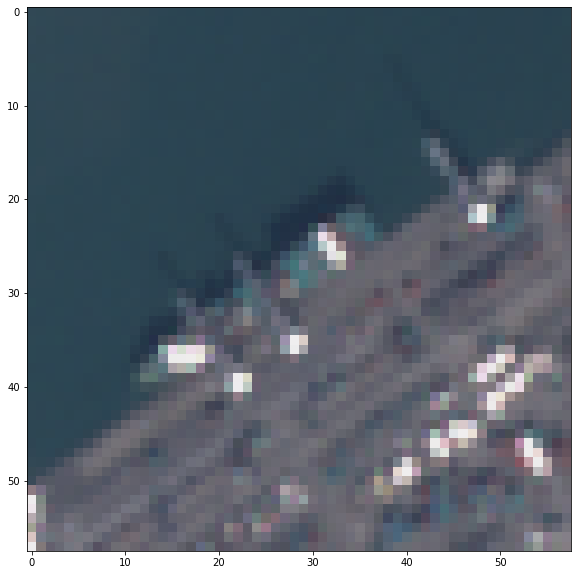

In [61]:
x, y = transform_lat_lng(gdf_subset_mean["LON"].values, gdf_subset_mean["LAT"].values, transform)
patches, ratios, colors, patches_real = prepare_rects(x, y, gdf_subset_mean["Length"], 10, mask_cloud_free, mask_cloud_eroded, 0.2)
print(ratios)
fig, ax = plt.subplots(figsize=(10, 10))
show(patches_real[0], ax=ax)

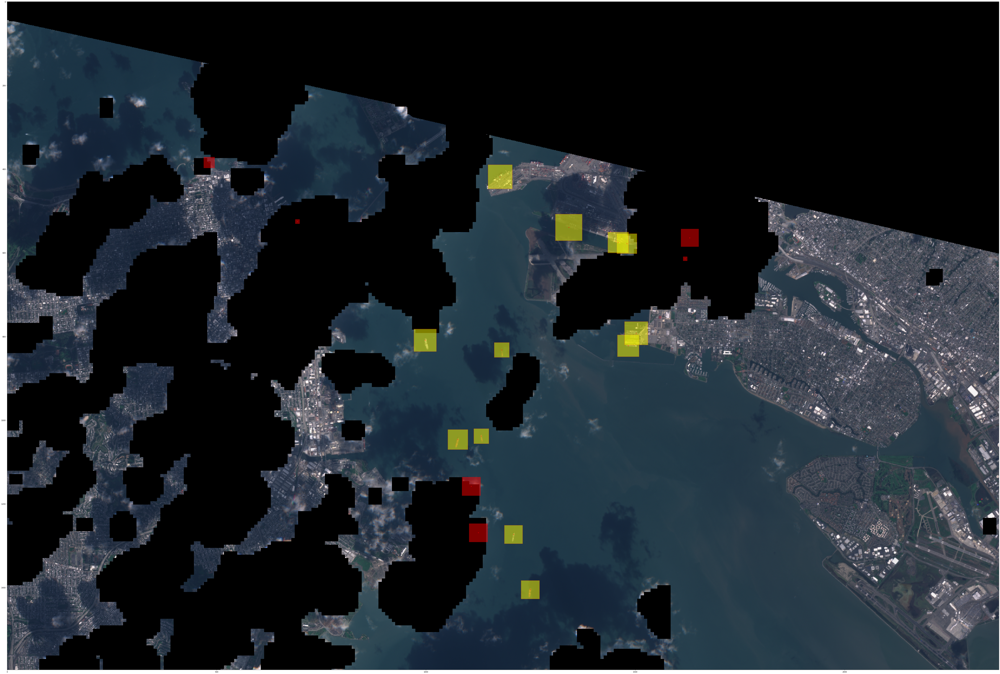

In [62]:
fig, ax = plt.subplots(figsize=(100, 100))
show(mask_cloud_free, ax=ax)
ax.plot(x,y,"r+")
coll = matplotlib.collections.PatchCollection(patches, facecolor=colors, edgecolor="red", alpha=0.5)
ax.add_collection(coll)